In [109]:
import os
import pickle
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [110]:
def load_file(file_path) -> pd.DataFrame:
    """
    Loads the pickle file into a dataframe.

    Parameters:
    ------------
    file_path: str; path to the pickle file

    Returns:
    ------------
    """
    tmp = pd.read_pickle(file_path)
    df = pd.merge(
        left=tmp["dataset"]["X"],
        right=tmp["dataset"]["Y"],
        how="left",
        left_index=True,
        right_index=True,
    )
    df.drop(columns=["TimeStamp", "WritesAvg"], inplace=True)
    df.rename(columns={"ReadsAvg": "label"}, inplace=True)
    df.reset_index(inplace=True, drop=True)

    return df

In [111]:
data_path = "../kv_data/kv/"
files = os.listdir(data_path)
ids = [file.split(".")[0] for file in files]
files_path = [os.path.join(data_path, file) for file in files]

In [112]:
#df = load_file("../kv_data/kv/0_0.pickle")
#df.shape

In [8]:
#l_mean = [print(round(df['label'].max(), 4)) for df in dfs]

In [5]:
def remove_outliers(dataframe, column):
    
    percentile25 = dataframe[column].quantile(0.25)
    percentile75 = dataframe[column].quantile(0.75)
    iqr = percentile75 - percentile25

    upper_limit = percentile75 + 1.5 * iqr
    lower_limit = percentile25 - 1.5 * iqr
    
    new_df = dataframe[dataframe['label'] < upper_limit]
    new_df = new_df[new_df['label'] > lower_limit]
    
    return new_df

In [6]:
def drop_columns(df):
  for i in df.columns:
    if df[i].max() == df[i].min():
      df.drop(i, axis=1, inplace=True)

In [7]:
dfs = [load_file(file) for file in files_path]

In [8]:
for i in dfs:
    drop_columns(i)
    #print(i.shape)

In [97]:
new_dfs = []
for df in dfs:
    new_df = remove_outliers(df,'label')
    new_dfs.append(new_df)

In [98]:
l_mean = [print(round(df['label'].max(), 4)) for df in new_dfs]

62.1689
63.6159
61.9359
62.2233
62.1689
63.6159
61.9359
62.2233
61.9359
62.2233
62.1689
63.6159
63.6159
62.1689
62.2233
61.9359
62.2233
61.9359
63.6159
62.1689
63.6159
62.1689
62.2233
61.9359


In [99]:
#new_df = new_df.sample(n=3000)

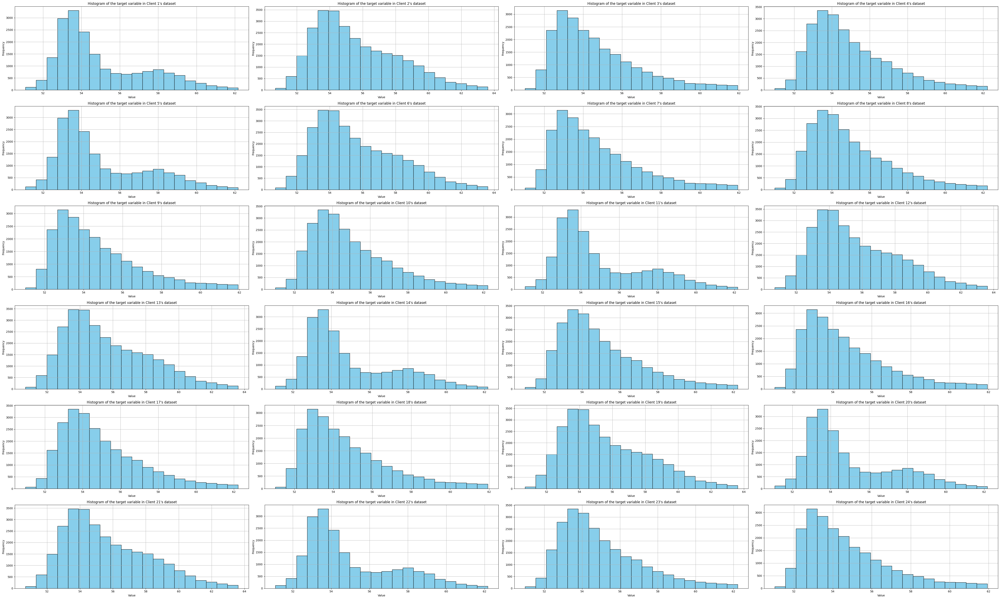

In [100]:
num_rows = len(new_dfs) // 4 + (len(new_dfs) % 4 > 0)

# Create a figure and subplots
fig, axes = plt.subplots(num_rows, 4, figsize=(50, 30))

# Plot histograms for label column in each dataframe
for i, df in enumerate(new_dfs):
    label_column = df.columns[-1]  # Assuming label column is the last column
    ax = axes[i // 4, i % 4] if num_rows > 1 else axes[i % 4]
    df[label_column].hist(ax=ax, bins=20, color='skyblue', edgecolor='black')
    ax.set_title(f'Histogram of the target variable in Client {i+1}\'s dataset')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

# Adjust layout and show plot
plt.tight_layout()
plt.show()

In [61]:
cov_matrix = new_dfs[0].corr()

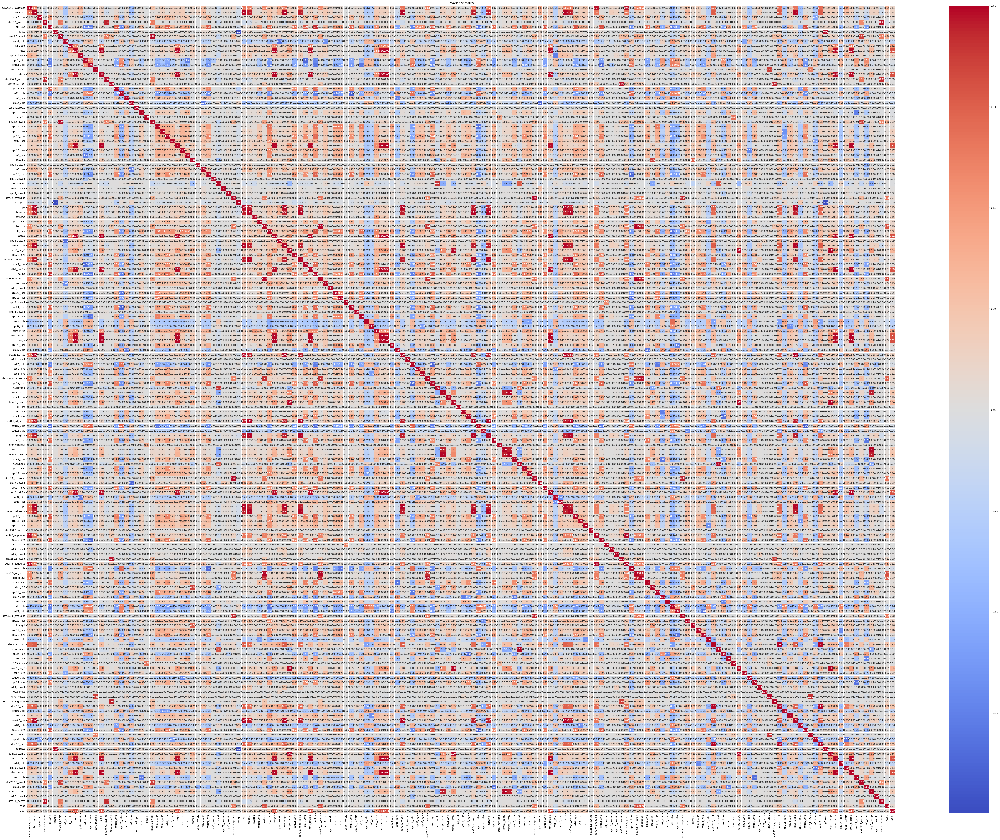

In [62]:
plt.figure(figsize=(80, 60))
sns.heatmap(cov_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Covariance Matrix')
plt.show()

In [63]:

#number_of_data_points = [random.randint(700, 3000) for _ in range(24)]

In [101]:
def update_distribution(original_df, adj_mean, adj_std, samples):
    """
    """
    original_mean = original_df['label'].mean()
    original_std = original_df['label'].std()
    desired_mean = original_mean + adj_mean  
    desired_std = original_std * adj_std
    z_scores = (original_df['label'] - original_mean) / original_std
    weights = np.exp(-0.5 * ((z_scores - (desired_mean - original_mean) / desired_std) ** 2))
    updated_df = original_df.sample(n=samples, replace=False, weights=weights)
    
    return updated_df

def update_distribution(original_df, adj_mean, adj_std, samples):
    original_mean = original_df['label'].mean()
    original_std = original_df['label'].std()
    desired_mean = original_mean + adj_mean  
    desired_std = original_std * adj_std
    
    # Introduce randomness in weights calculation
    # Randomly perturb the z-scores
    random_perturbation = np.random.normal(loc=0, scale=0.1, size=len(original_df))
    z_scores = (original_df['label'] - original_mean) / original_std + random_perturbation
    
    # Adjust weights to increase scattering effect
    weights = np.exp(-0.5 * ((z_scores - (desired_mean - original_mean) / original_std) ** 2))
    
    # Normalize weights to ensure they sum up to 1
    weights /= np.sum(weights)
    
    updated_df = original_df.sample(n=samples, replace=False, weights=weights)
    
    return updated_df

In [102]:
number_of_data_points = [random.randint(2000, 15000) for _ in range(24)]
adj_means = [random.randint(-10, 10) for _ in range(24)]
adj_stds = [random.choice([num for num in range(-3, 6) if num != 0]) for _ in range(24)]
adj_means

[-10,
 -2,
 4,
 1,
 9,
 -9,
 -2,
 4,
 5,
 2,
 2,
 -2,
 8,
 3,
 -5,
 -10,
 -1,
 4,
 -10,
 -1,
 -4,
 -7,
 4,
 9]

In [103]:
#new_dfs = [d.sample(n=3000) for d in new_dfs]

for i in range(24):
    # Sample `num_points` from the dataframe at index `i` in `new_dfs`
    new_dfs[i] = update_distribution(new_dfs[i], adj_means[i], adj_stds[i], number_of_data_points[i])   

In [79]:
#new_dfs =  [remove_outliers(df, "label") for df in new_dfs]

In [104]:

df = new_dfs[0].drop_duplicates()
new_dfs[0].shape

(3715, 170)

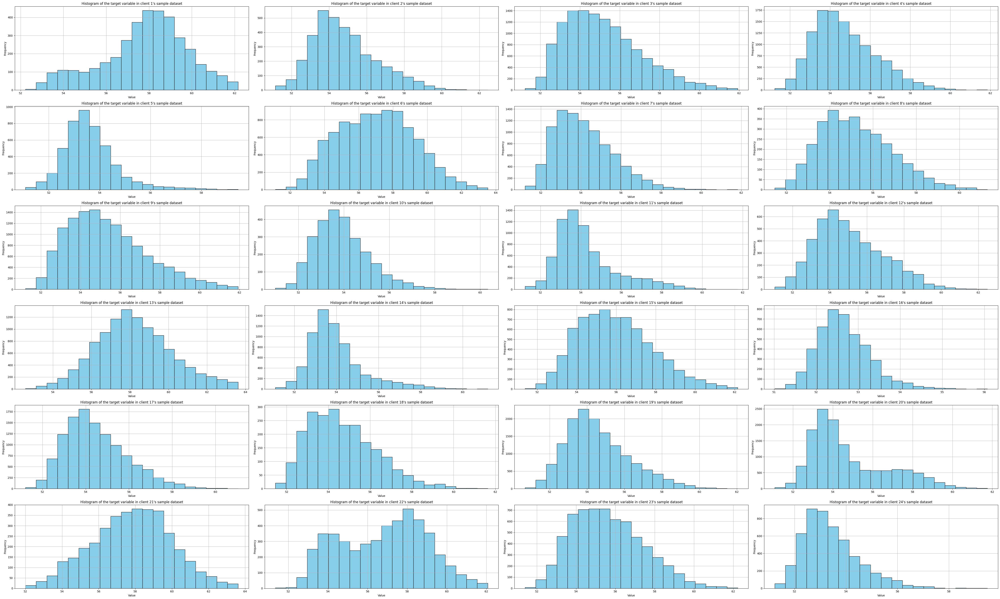

In [105]:
num_rows = len(new_dfs) // 4 + (len(new_dfs) % 4 > 0)

# Create a figure and subplots
fig, axes = plt.subplots(num_rows, 4, figsize=(50, 30))

# Plot histograms for label column in each dataframe
for i, df in enumerate(new_dfs):
    label_column = df.columns[-1]  # Assuming label column is the last column
    ax = axes[i // 4, i % 4] if num_rows > 1 else axes[i % 4]
    df[label_column].hist(ax=ax, bins=20, color='skyblue', edgecolor='black')
    ax.set_title(f'Histogram of the target variable in client {i+1}\'s sample dataset')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

# Adjust layout and show plot
plt.tight_layout()
plt.show()

In [119]:
rounded_means = [round(df['label'].std(), 2) for df in new_dfs]
rounded_means

[1.97,
 1.69,
 1.91,
 1.55,
 1.05,
 2.21,
 1.44,
 1.65,
 2.01,
 1.2,
 1.52,
 1.82,
 1.96,
 1.33,
 1.88,
 0.62,
 1.43,
 1.62,
 1.7,
 1.92,
 2.15,
 2.18,
 1.79,
 1.08]

In [88]:
import numpy as np
from scipy import stats

In [89]:
round(1.0423091718013731e-276,50)

0.0

In [90]:
from itertools import combinations
pairs = list(combinations(range(24), 2))

In [91]:
new_dfs[0].columns

Index(['dev252.0_avgqu.sz', 'i116_intr.s', 'cpu0_.sys', 'dev8.5_svctm',
       'all_..sys', 'frmpg.s', 'dev8.0_await', 'cpu4_.idle', 'all_..soft',
       'irec.s',
       ...
       'cpu0_.iowait', 'eth1_txpck.s', 'cpu11_.idle', 'dev252.0_await',
       'cpu3_.idle', 'temp3_.temp', 'cpu17_.iowait', 'dev8.0_svctm', 'wtps',
       'label'],
      dtype='object', length=170)

In [92]:
for feature in list(new_dfs[0].columns):
    samples = [i[feature].values for i in dfs]
    res = stats.anderson_ksamp(samples)
    res.statistic, res.pvalue

    if res.pvalue > 0.01:
        print(feature)
        print(res.pvalue)

/var/folders/nc/qf87_4nn3qv8g_f3kl5wytb00000gn/T/ipykernel_4086/2049175091.py:3: UserWarning: p-value floored: true value smaller than 0.001. Consider specifying `method` (e.g. `method=stats.PermutationMethod()`.)
  res = stats.anderson_ksamp(samples)
/var/folders/nc/qf87_4nn3qv8g_f3kl5wytb00000gn/T/ipykernel_4086/2049175091.py:3: UserWarning: p-value capped: true value larger than 0.25. Consider specifying `method` (e.g. `method=stats.PermutationMethod()`.)
  res = stats.anderson_ksamp(samples)


eth1_rxdrop.s
0.25


In [93]:
samples = [i["eth1_rxdrop.s"].values for i in new_dfs]
res = stats.anderson_ksamp(samples)
res.statistic, res.pvalue

/var/folders/nc/qf87_4nn3qv8g_f3kl5wytb00000gn/T/ipykernel_4086/1120903725.py:2: UserWarning: p-value capped: true value larger than 0.25. Consider specifying `method` (e.g. `method=stats.PermutationMethod()`.)
  res = stats.anderson_ksamp(samples)


(-1.8886463547122863, 0.25)

In [94]:
for i in pairs:
    p_value = stats.ks_2samp(new_dfs[i[0]].label.values, new_dfs[i[1]].label.values).pvalue
    #p_value = round(p_value,10)
    #print(p_value)
    if p_value >= 0.001:
        print(i)
        print(p_value)

(9, 11)
0.0027053959827809037


In [164]:
import numpy as np
from scipy.linalg import sqrtm
from scipy.spatial.distance import euclidean

# Assume we have two datasets: dataset1 and dataset2
# Each dataset has 169 features
dataset1 = np.random.rand(100, 169)
dataset2 = np.random.rand(100, 169)

# Calculate the mean and covariance of each dataset
mean1 = np.mean(dataset1, axis=0)
cov1 = np.cov(dataset1, rowvar=False)
mean2 = np.mean(dataset2, axis=0)
cov2 = np.cov(dataset2, rowvar=False)

# Calculate the Hellinger distance between the two datasets
hellinger_dist = euclidean(mean1, mean2) / np.sqrt(2) + np.trace(cov1 + cov2 - 2 * sqrtm(sqrtm(cov1).dot(cov2).dot(sqrtm(cov1)))) / 2

In [165]:
hellinger_dist

(5.9616259082353515+3.821183639762884e-09j)

In [176]:
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import rbf_kernel

def compute_mmd(df1, df2, gamma=1.0):
    """Compute the Maximum Mean Discrepancy (MMD) between two dataframes df1 and df2"""
    X = df1.values
    Y = df2.values
    XX = rbf_kernel(X, X, gamma=gamma)
    YY = rbf_kernel(Y, Y, gamma=gamma)
    XY = rbf_kernel(X, Y, gamma=gamma)
    return XX.mean() + YY.mean() - 2 * XY.mean()

# Assume we have two dataframes: df1 and df2
# Each dataframe has 169 features
df1 = pd.DataFrame(np.random.rand(100, 169))
df2 = pd.DataFrame(np.random.rand(100, 169))

# Compute the MMD between the two dataframes
mmd = compute_mmd(new_dfs[3], new_dfs[23])

print(mmd)

# If the MMD is significantly different from zero, we can conclude that the datasets are non-IID
if mmd > 0.05:
    print("The datasets are non-IID.")
else:
    print("The datasets are IID.")


0.00036548818917390795
The datasets are IID.


In [68]:
new_dfs[4]["label"].skew()

-0.21908750978887837

In [114]:
for i in range(24):
    print(new_dfs[i].shape)
    file_name = "filtered_df/c"+str(i+1)+".csv"
    new_dfs[i].to_csv(file_name, index=False)

(3715, 170)
(3506, 170)
(12395, 170)
(11821, 170)
(4664, 170)
(9080, 170)
(8958, 170)
(3171, 170)
(12834, 170)
(2632, 170)
(6898, 170)
(4634, 170)
(10763, 170)
(6795, 170)
(7149, 170)
(4397, 170)
(11616, 170)
(2258, 170)
(14599, 170)
(13776, 170)
(3690, 170)
(4830, 170)
(6355, 170)
(5120, 170)


In [ ]:
original_mean = df['label'].mean()

In [ ]:
original_mean

In [ ]:
original_mean = df['label'].mean()
original_std = df['label'].std()

In [ ]:
desired_mean = original_mean + 5  # for example, increase the mean by 5
desired_std = original_std * 1.5  # for example, increase the standard deviation by 50%

In [ ]:
z_scores = (df['label'] - original_mean) / original_std

In [ ]:
import numpy as np
weights = np.exp(-0.5 * ((z_scores - (desired_mean - original_mean) / original_std) ** 2))

In [ ]:
sample = df.sample(n=1000, replace=True, weights=weights)

In [ ]:
sample['label'].hist()

In [ ]:
#  1. Compare summary statistics such as mean, median, variance, skewness, and kurtosis between the two distributions.
#  2. The Kolmogorov-Smirnov test compares the cumulative distribution functions (CDFs) of two distributions. 
#   It tests the null hypothesis that the samples are drawn from the same distribution. 
#  The scipy.stats.ks_2samp function can be used for this test.
# The Anderson-Darling test is another test of whether two samples come from the same distribution. 
# It gives more weight to differences in the tails of the distribution compared to the Kolmogorov-Smirnov test. 
# Can use scipy.stats.anderson_ksamp for this test.

In [ ]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.distplot(df['label'])
plt.subplot(2,2,2)
sns.boxplot(df['label'])
plt.subplot(2,2,3)
sns.distplot(new_df['label'])
plt.subplot(2,2,4)
sns.boxplot(new_df['label'])
plt.show()

In [ ]:
# There are few columns which have same values, so this function drops those columns.
def drop_columns(df):
  for i in df.columns:
    if df[i].max() == df[i].min():
      df.drop(i, axis=1, inplace=True)

In [ ]:
# Drop NULL values
def dropna(df):
  print(df.isnull().sum())
  df.dropna(axis=1)

In [ ]:
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = new_df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [ ]:
#Correlation with output variable
cor_target = abs(cor["label"])
#Selecting highly correlated features
relevant_features = cor_target[cor_target>0.2]
relevant_features